## Selected Model - XGBClassifier_Opt_SMOTE


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
# Disable warnings 
import warnings
warnings.filterwarnings('ignore')

In [3]:
C_train=pd.read_csv("train-2.csv")

In [4]:
C_train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no


In [5]:
C_train.shape

(4250, 20)

In [6]:
C_train['churn'].value_counts()

no     3652
yes     598
Name: churn, dtype: int64

In [7]:
C_train.isnull().sum()

state                            0
account_length                   0
area_code                        0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
churn                            0
dtype: int64

In [40]:
def dataoveriew(df, message):
    print(f'{message}:\n')
    print("Rows:", df.shape[0])
    print("\nNumber of features:", df.shape[1])
    print("\nFeatures:")
    print(df.columns.tolist())
    print("\nMissing values:", df.isnull().sum().values.sum())
    print("\nUnique values:")
    print(df.nunique())
    print("\nDatatypes of the variables:")
    print(df.dtypes)

In [41]:
dataoveriew(C_train, 'Overiew of the training dataset')

Overiew of the training dataset:

Rows: 4250

Number of features: 20

Features:
['state', 'account_length', 'area_code', 'international_plan', 'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes', 'total_day_calls', 'total_day_charge', 'total_eve_minutes', 'total_eve_calls', 'total_eve_charge', 'total_night_minutes', 'total_night_calls', 'total_night_charge', 'total_intl_minutes', 'total_intl_calls', 'total_intl_charge', 'number_customer_service_calls', 'churn']

Missing values: 0

Unique values:
state                              51
account_length                    215
area_code                           3
international_plan                  2
voice_mail_plan                     2
number_vmail_messages              46
total_day_minutes                1843
total_day_calls                   120
total_day_charge                 1843
total_eve_minutes                1773
total_eve_calls                   123
total_eve_charge                 1572
total_night_minutes            

## 2. Exploratory Data Analysis

In [42]:
import plotly.offline as py # visualization
py.init_notebook_mode(connected=True) 
import plotly.graph_objs as go # visualization
trace = go.Pie(labels = C_train["churn"].value_counts().keys().tolist(),
               values = C_train["churn"].value_counts().values.tolist(),
               marker = dict(colors = ['LightSkyBlue','MediumPurple'],
                             line = dict(color = "white", width =  1.3)
                            ),
               rotation = 90,
               hoverinfo = "label+value+text",
               hole = .5
              )
layout = go.Layout(dict(title = "Customer churn in training data",
                        plot_bgcolor = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                       )
                  )
data = [trace]
fig = go.Figure(data = data, layout = layout)
py.iplot(fig)

### Customer churn in data

In [43]:
C_train.dtypes

state                             object
account_length                     int64
area_code                         object
international_plan                object
voice_mail_plan                   object
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
churn                             object
dtype: object

In [44]:
C_train.shape

(4250, 20)

In [45]:
C_train.describe().T

,count,mean,std,min,25%,50%,75%,max
account_length,4250.0,100.236235,39.698401,1.0,73.0000,100.00,127.0000,243.00
number_vmail_messages,4250.0,7.631765,13.439882,0.0,0.0000,0.00,16.0000,52.00
total_day_minutes,4250.0,180.259600,54.012373,0.0,143.3250,180.45,216.2000,351.50
total_day_calls,4250.0,99.907294,19.850817,0.0,87.0000,100.00,113.0000,165.00
total_day_charge,4250.0,30.644682,9.182096,0.0,24.3650,30.68,36.7500,59.76
total_eve_minutes,4250.0,200.173906,50.249518,0.0,165.9250,200.70,233.7750,359.30
total_eve_calls,4250.0,100.176471,19.908591,0.0,87.0000,100.00,114.0000,170.00
total_eve_charge,4250.0,17.015012,4.271212,0.0,14.1025,17.06,19.8675,30.54
total_night_minutes,4250.0,200.527882,50.353548,0.0,167.2250,200.45,234.7000,395.00
total_night_calls,4250.0,99.839529,20.093220,0.0,86.0000,100.00,113.0000,175.00


## Transforming Data

### Normalize Numeric Columns

In [46]:
C_train.dtypes

state                             object
account_length                     int64
area_code                         object
international_plan                object
voice_mail_plan                   object
number_vmail_messages              int64
total_day_minutes                float64
total_day_calls                    int64
total_day_charge                 float64
total_eve_minutes                float64
total_eve_calls                    int64
total_eve_charge                 float64
total_night_minutes              float64
total_night_calls                  int64
total_night_charge               float64
total_intl_minutes               float64
total_intl_calls                   int64
total_intl_charge                float64
number_customer_service_calls      int64
churn                             object
dtype: object

In [47]:
# Create Dummy Variables separately for state and area code
#st_area = pd.get_dummies(C_train, columns=['state', 'area_code'])
state_dum = pd.get_dummies(C_train['state'])
area_dum = pd.get_dummies(C_train['area_code'])

In [48]:
area_dum.head()

,area_code_408,area_code_415,area_code_510
0,0,1,0
1,0,1,0
2,1,0,0
3,0,1,0
4,0,0,1


In [49]:
# Do the same for our test set
#test = pd.get_dummies(test, columns=['state', 'area_code'])
#Numeric input features
numeric = C_train[['account_length','number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls']]
from sklearn.preprocessing import MinMaxScaler
# fit scaler on training data
norm = MinMaxScaler().fit(numeric)
# transform training data
normal_numeric_data = norm.transform(numeric)
cols = numeric.columns.values
# normalized data to dataframe
normal_numeric_data = pd.DataFrame(data = normal_numeric_data, columns = cols)
normal_numeric_data.head(5)

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
0,0.438017,0.500000,0.459744,0.745455,0.459672,0.544114,0.605882,0.544204,0.644051,0.588571,0.644344,0.685,0.15,0.685185,0.111111
1,0.561983,0.000000,0.692461,0.690909,0.692436,0.337323,0.647059,0.337263,0.411646,0.594286,0.411930,0.610,0.25,0.609259,0.000000
2,0.342975,0.000000,0.851778,0.430303,0.851740,0.172279,0.517647,0.172233,0.498481,0.508571,0.498593,0.330,0.35,0.329630,0.222222
3,0.305785,0.000000,0.474253,0.684848,0.474230,0.412747,0.717647,0.412901,0.473165,0.691429,0.473270,0.505,0.15,0.505556,0.333333
4,0.495868,0.461538,0.620768,0.533333,0.620649,0.969942,0.635294,0.969876,0.538228,0.674286,0.538548,0.375,0.35,0.375926,0.333333


### Standardizing Categorical Columns

In [50]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
Categorical = C_train[['international_plan','voice_mail_plan','churn']]
Categorical = Categorical.apply(LabelEncoder().fit_transform)
Categorical.head(5)

,international_plan,voice_mail_plan,churn
0,0,1,0
1,0,0,0
2,1,0,0
3,1,0,0
4,0,1,0


In [51]:
#Concatenating  numeriacal and categorical dataframe
Final_df =  pd.concat([state_dum,area_dum,normal_numeric_data, Categorical], axis=1)
Final_df.head()

,AK,AL,AR,AZ,CA,CO,CT,DC,DE,FL,...,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,international_plan,voice_mail_plan,churn
0,0,0,0,0,0,0,0,0,0,0,...,0.644051,0.588571,0.644344,0.685,0.15,0.685185,0.111111,0,1,0
1,0,0,0,0,0,0,0,0,0,0,...,0.411646,0.594286,0.411930,0.610,0.25,0.609259,0.000000,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0.498481,0.508571,0.498593,0.330,0.35,0.329630,0.222222,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0.473165,0.691429,0.473270,0.505,0.15,0.505556,0.333333,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0.538228,0.674286,0.538548,0.375,0.35,0.375926,0.333333,0,1,0


In [52]:
Final_df.shape

(4250, 72)

In [53]:
Final_df.columns

Index(['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI',
       'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN',
       'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH',
       'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA',
       'WI', 'WV', 'WY', 'area_code_408', 'area_code_415', 'area_code_510',
       'account_length', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'international_plan',
       'voice_mail_plan', 'churn'],
      dtype='object')

In [54]:
#Final_df.churn.value_counts()

### SMOTE Oversampling teqnique for imbalance dataset

In [55]:
# SMOTE Oversampling teqnique of the imbalance dataset
X=Final_df.drop('churn',axis=1)
y=Final_df['churn']
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size = 0.25, random_state = 42,stratify=y)
#Dataset is imbalance
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)
X_train_Smote, y_train_Smote= sm.fit_resample(X_train, y_train)


In [56]:
#We can observe the increment in the data points afetr the smote
X_train_Smote.shape,y_train_Smote.shape

((5478, 71), (5478,))

In [57]:
#Its a orginal training data 
X_train.shape,y_train.shape

((3187, 71), (3187,))

In [58]:
X_test.shape,y_test.shape

((1063, 71), (1063,))

## Baseline model Building

**Basemodel Build, Score & Comparision after hyperparameter Tunning through GridsearchCv**

In [59]:
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import roc_auc_score, roc_curve,scorer, f1_score, precision_score, recall_score
from sklearn.metrics import precision_recall_curve, average_precision_score
from mlxtend.plotting import plot_confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix 
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import accuracy_score
import plotly.express as px
from sklearn.metrics import roc_curve, auc
def evaluate_model(X_train, y_train, model):
    #X_train, X_test, y_train, y_test = train_test_split(X, y,test_size = 0.25, random_state = 42,stratify=y)
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    scores = cross_val_score(model, X_train, y_train, cv=3, scoring="accuracy")
    diff = scores.mean() - model.score(X_test, y_test)
    SD = diff / scores.std()
    
    print(f"Training Score:{model.score(X_train, y_train)}")
    print(f"Cross V Score: {scores.mean()} +/- {scores.std()}")
    print(f"Testing Score: {model.score(X_test, y_test)}")
    print(f"Cross & Test Diff: {diff}")
    print(f"Standard Deviations Away: {SD}")
    #print(f"Confusion Matrix: {confusion_matrix(y_test, preds)}")
    print(f"Report: {classification_report(y_test, preds)}")
    print(f"Accuracy Score: {accuracy_score(y_test, preds)}")

    plot_confusion_matrix(model, 
                      X_test, 
                      y_test,
                      values_format='d',
                      display_labels=['Not_Churn', 'Churn'])
      
    confusion_matrix(y_test, preds)
    
    #Plot ROC Curve
    y_pred_prob = model.predict_proba(X_test)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

    fig = px.area(x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate(1-Specificity)', y='True Positive Rate(Sensitivity)'),
    width=700, height=500
    
       )
    fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
     )

    fig.update_yaxes(scaleanchor="x", scaleratio=1)
    fig.update_xaxes(constrain='domain')
    fig.show()

## 1. XGBOOST 
### Hyperparameter tuning using OPTUNA

In [60]:
gbm_optuna = xgb.XGBClassifier(
    n_estimators = 630,
    learning_rate = 0.02,random_state =42,
    booster = 'dart',
    reg_lambda = 0.000537188870140782,
    alpha = 4.183769589573285e-07,
    max_depth = 8,
    eta = 0.1041103115293149,
    gamma = 0.009723248119317662,
    grow_policy = 'lossguide')


Training Score:1.0
Cross V Score: 0.9545016738919508 +/- 0.0032139487889404224
Testing Score: 0.9604891815616181
Cross & Test Diff: -0.005987507669667269
Standard Deviations Away: -1.8629754432525467
Report:               precision    recall  f1-score   support

           0       0.96      0.99      0.98       913
           1       0.93      0.78      0.85       150

    accuracy                           0.96      1063
   macro avg       0.95      0.89      0.91      1063
weighted avg       0.96      0.96      0.96      1063

Accuracy Score: 0.9604891815616181


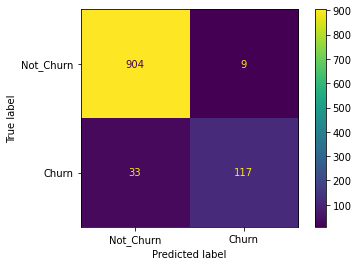

In [61]:
evaluate_model(X_train,y_train,gbm_optuna)

## 2. XGBoost
### Optuna Parameters with Smote

Training Score:0.9985396129974443
Cross V Score: 0.9558232931726908 +/- 0.02227389418425651
Testing Score: 0.9539040451552211
Cross & Test Diff: 0.0019192480174696769
Standard Deviations Away: 0.08616580475749173
Report:               precision    recall  f1-score   support

           0       0.97      0.98      0.97       913
           1       0.87      0.79      0.83       150

    accuracy                           0.95      1063
   macro avg       0.92      0.89      0.90      1063
weighted avg       0.95      0.95      0.95      1063

Accuracy Score: 0.9539040451552211


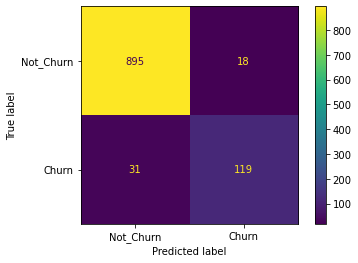

In [62]:
gbm_optuna_SMOTE = xgb.XGBClassifier(
    n_estimators = 630,
    learning_rate = 0.02,random_state =42,
    booster = 'dart',
    reg_lambda = 0.000537188870140782,
    alpha = 4.183769589573285e-07,
    max_depth = 8,
    eta = 0.1041103115293149,
    gamma = 0.009723248119317662,
    grow_policy = 'lossguide')
    

evaluate_model(X_train_Smote,y_train_Smote,gbm_optuna_SMOTE)



This predict method  predits the probality for each class and then chooses the class with the highest probability 
as the  predicted response.another way of thinking There is  0.5 classsification thershold and class 1 is predicted only  thershold exceeds 0.5 otherwise 0 is predicted

In [148]:
gbm_optuna_SMOTE_Thers = xgb.XGBClassifier(
    n_estimators = 630,
    learning_rate = 0.02,random_state =42,
    booster = 'gbtree',
    reg_lambda = 0.000537188870140782,
    alpha = 4.183769589573285e-07,
    max_depth = 8,
    eta = 0.1041103115293149,
    gamma = 0.009723248119317662,
    grow_policy = 'lossguide')
 

In [90]:
gbm_optuna_SMOTE_Thers.fit(X_train_Smote,y_train_Smote)

XGBClassifier(alpha=4.183769589573285e-07, base_score=0.5, booster='gbtree',
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              eta=0.1041103115293149, gamma=0.009723248119317662, gpu_id=-1,
              grow_policy='lossguide', importance_type='gain',
              interaction_constraints='', learning_rate=0.02, max_delta_step=0,
              max_depth=8, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=630, n_jobs=0,
              num_parallel_tree=1, random_state=42, reg_alpha=4.1837697e-07,
              reg_lambda=0.000537188870140782, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [91]:
# print the first 10 predicted responses
gbm_optuna_SMOTE_Thers.predict(X_test)[0:10]#[0:10] Its a single dimensional array of 0 and 1s.


array([1, 1, 0, 0, 1, 0, 0, 0, 0, 0])

This predict method  predits the probality for each class and then chooses the class with the highest probability 
as the  predicted response.another way of thinking There is  0.5 classsification thershold and class 1 is predicted only  thershold exceeds 0.5 otherwise 0 is predicted

In [92]:
# store the predicted probabilities for class 1
y_pred_prob = gbm_optuna_SMOTE_Thers.predict_proba(X_test)[0:10,:]#predicticted probability of each class.2 possible response classes .The column 0 and column 1.
#the columns coeffThe model learns the coeffients of each input instance which calculates the likely wood of each class of eacch observation. 
y_pred_prob

array([[0.06473237, 0.9352676 ],
       [0.02488965, 0.97511035],
       [0.97378707, 0.02621293],
       [0.9880384 , 0.01196159],
       [0.02347881, 0.9765212 ],
       [0.9467639 , 0.05323611],
       [0.99096406, 0.00903595],
       [0.9867599 , 0.01324009],
       [0.96141577, 0.03858421],
       [0.9794657 , 0.0205343 ]], dtype=float32)

In [93]:

y_pred_prob = gbm_optuna_SMOTE_Thers.predict_proba(X_test)[:,1]

Text(0, 0.5, 'Frequency')

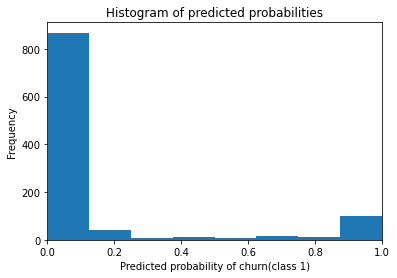

In [94]:
%matplotlib inline
import matplotlib.pyplot as plt
# histogram of predicted probabilities
plt.hist(y_pred_prob, bins=8)
plt.xlim(0, 1)
plt.title('Histogram of predicted probabilities')
plt.xlabel('Predicted probability of churn(class 1)')
plt.ylabel('Frequency')

#### Decrease the threshold for predicting churn in order to increase the sensitivity of the classifier
 It will be the last step

In [128]:
# predict churn if the predicted probability is greater than 0.3
from sklearn.preprocessing import binarize
y_pred_class = binarize([y_pred_prob], 0.10)[0] # thershold value to 0.1.to binarise will return the value
#1 which is above .1 & 0 otherwise
y_pred_class  

array([1., 1., 0., ..., 0., 0., 1.], dtype=float32)

In [129]:
# print the first 10 predicted probabilities
y_pred_prob[0:10]

array([0.9352676 , 0.97511035, 0.02621293, 0.01196159, 0.9765212 ,
       0.05323611, 0.00903595, 0.01324009, 0.03858421, 0.0205343 ],
      dtype=float32)

In [130]:
# print the first 10 predicted classes with the lower threshold
y_pred_class[0:20]

array([1., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 1., 0., 0.,
       0., 0., 0.], dtype=float32)

In [131]:
# new confusion matrix (threshold of 0.3)
print(confusion_matrix(y_test, y_pred_class))

[[826  87]
 [ 21 129]]


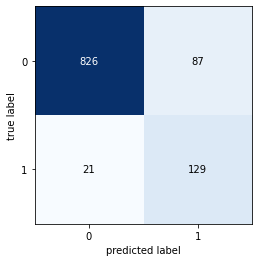

In [132]:
from mlxtend.plotting import plot_confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
A = confusion_matrix(y_test, y_pred_class)

fig, ax = plot_confusion_matrix(conf_mat=A)
plt.show()

In [133]:
print(recall_score(y_test, y_pred_class))
print(precision_score(y_test, y_pred_class))


0.86
0.5972222222222222


In [134]:
Clf_after_thershold = classification_report(y_test, y_pred_class)
print(Clf_after_thershold)

              precision    recall  f1-score   support

           0       0.98      0.90      0.94       913
           1       0.60      0.86      0.70       150

    accuracy                           0.90      1063
   macro avg       0.79      0.88      0.82      1063
weighted avg       0.92      0.90      0.91      1063



In [135]:
#Threshold of 0.5 is used by default (for binary problems) to convert predicted probabilities into class predictions
#Threshold can be adjusted to increase sensitivity or specificity
#Sensitivity and specificity have an inverse relationship

In [136]:
import plotly.express as px
from sklearn.metrics import roc_curve, auc

fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

fig = px.area(
    x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate(1-Specificity)', y='True Positive Rate(Sensitivity)'),
    width=700, height=500
)
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

In [137]:
# define a function that accepts a threshold and prints sensitivity and specificity
def evaluate_threshold(threshold):
    print('Sensitivity:', tpr[thresholds > threshold][-1])
    print('Specificity:', 1 - fpr[thresholds > threshold][-1])

In [138]:
evaluate_threshold(0.25)

Sensitivity: 0.8133333333333334
Specificity: 0.9715224534501643


#### AUC is the percentage of the ROC plot that is underneath the curve:

In [139]:

print(roc_auc_score(y_test, y_pred_prob))

0.9210806863818911


AUC is useful as a single number summary of classifier performance.
If you randomly chose one positive and one negative observation, AUC represents the likelihood that your classifier will assign a higher predicted probability to the positive observation.
AUC is useful even when there is high class imbalance (unlike classification accuracy).

#### Classic feature attributions

If the  telecom provider wants to identify what factors which are driving customers to churn with the with the help of these shap values we can directly address to those factors to improve customer retention.

Here we try out the global feature importance calcuations that come with XGBoost. Note that they all contradict each other, which motivates the use of SHAP values since they come with consistency gaurentees (meaning they will order the features correctly).

In [107]:
X_display,y_display = X,y

In [108]:
X_display.shape


(4250, 71)

<Figure size 1080x1080 with 0 Axes>

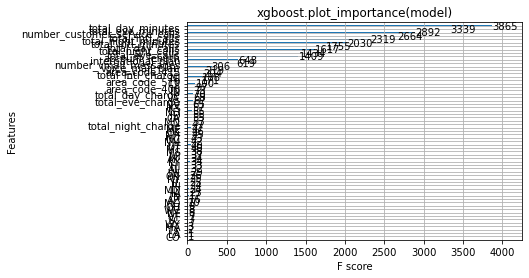

In [125]:
import shap
import xgboost
# print the JS visualization code to the notebook
shap.initjs()
plt.figure(figsize=(15,15))
xgboost.plot_importance(gbm_optuna_SMOTE_Thers )
plt.title("xgboost.plot_importance(model)")
plt.show();

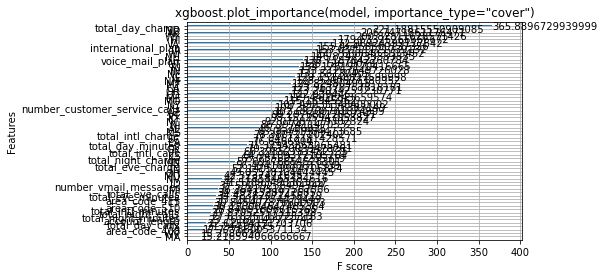

In [126]:
xgboost.plot_importance(gbm_optuna_SMOTE_Thers, importance_type="cover")
plt.title('xgboost.plot_importance(model, importance_type="cover")')
plt.show()

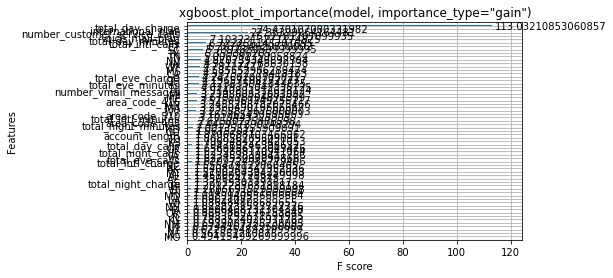

In [127]:
xgboost.plot_importance(gbm_optuna_SMOTE_Thers, importance_type="gain")
plt.title('xgboost.plot_importance(model, importance_type="gain")')
plt.show()

### Explain predictions

Here we use the Tree SHAP implementation integrated into XGBoost to explain the entire dataset (4,250)

In [112]:
explainer = shap.TreeExplainer(gbm_optuna_SMOTE_Thers)
shap_values = explainer.shap_values(X)

In [113]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X_display.iloc[0,:])

## Visualize many predictions

 Visualizing 2,000 individuals.

In [114]:
shap.force_plot(explainer.expected_value, shap_values[:2000,:], X_display.iloc[:2000,:])

### Bar chart of mean importance

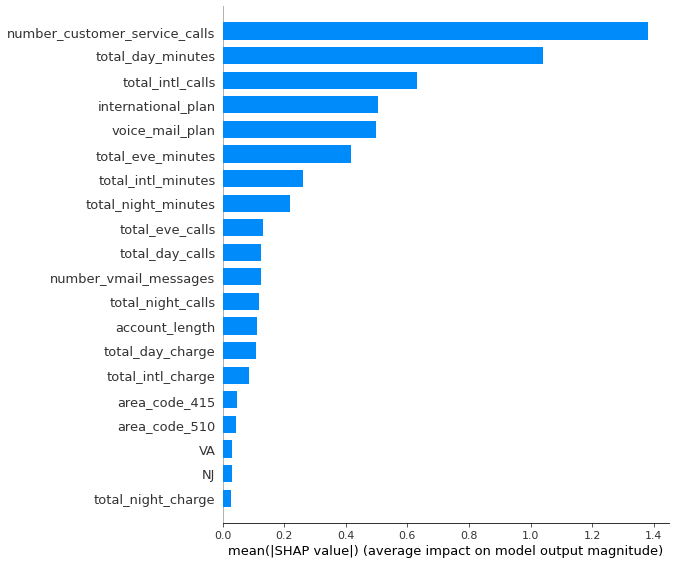

In [115]:
shap.summary_plot(shap_values, X_display, plot_type="bar")

### SHAP Summary Plot



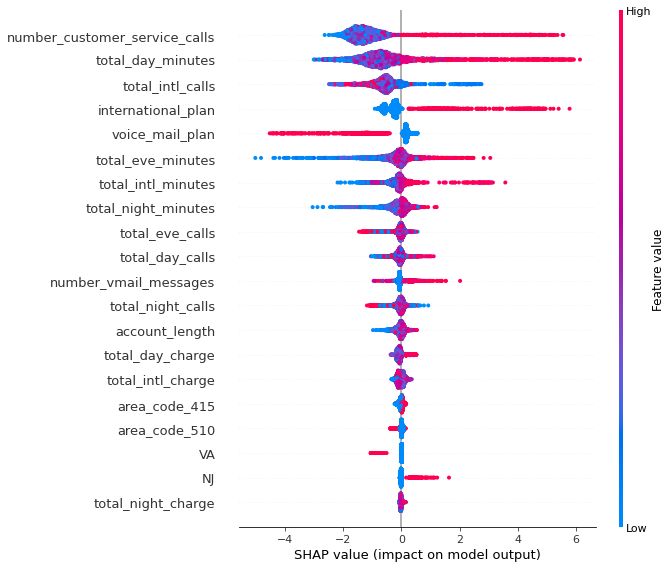

In [116]:
shap.summary_plot(shap_values, X)

### SHAP Dependence Plots

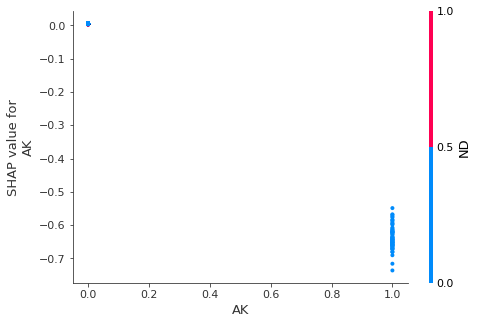

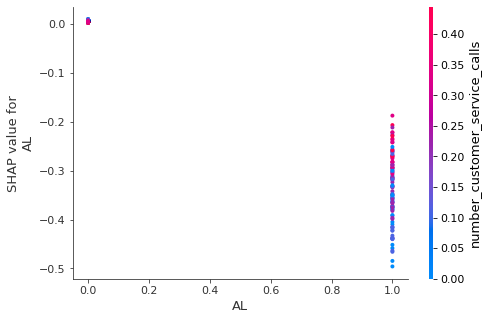

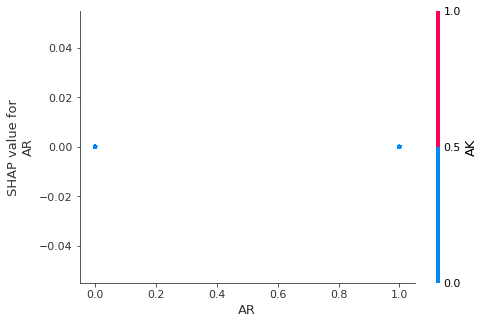

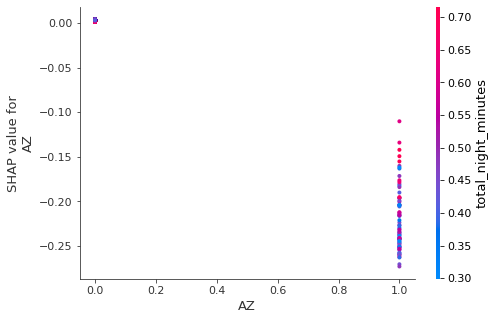

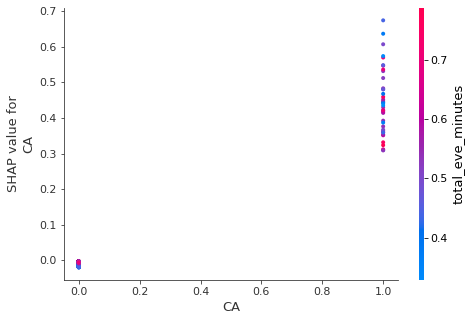

...

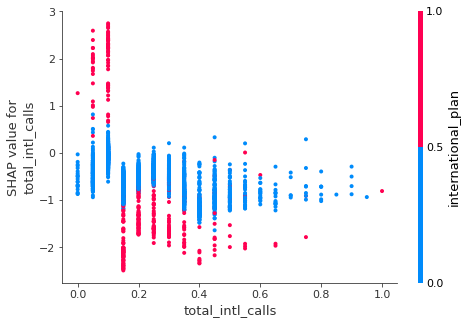

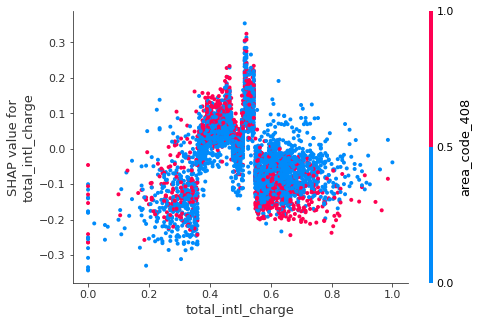

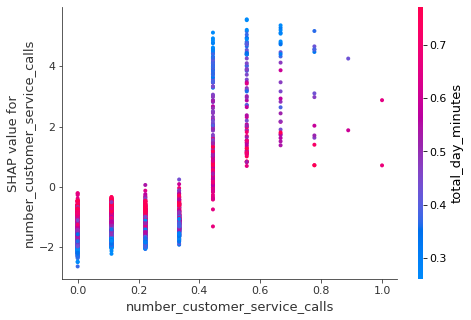

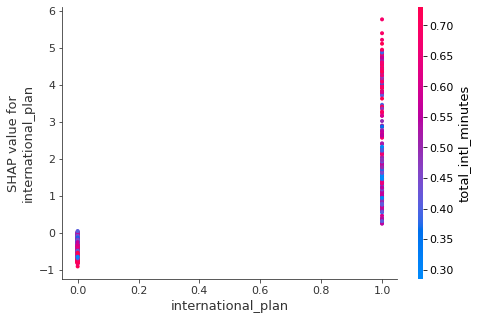

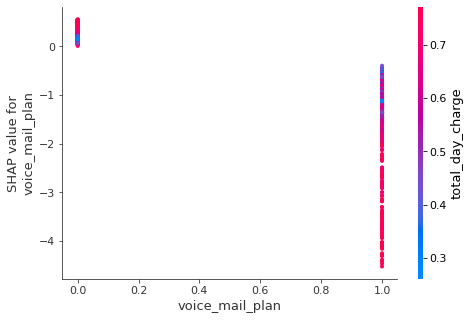

In [117]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values, X, display_features=X_display)

SHAP Values (an acronym from SHapley Additive exPlanations) break down a prediction to show the impact of each feature. 

In [140]:
def show_summary_report(actual, prediction, probabilities):

    if isinstance(actual, pd.Series):
        actual = actual.values
    if actual.dtype.name == 'object':
        actual = actual.astype(int)
    if prediction.dtype.name == 'object':
        prediction = prediction.astype(int)

    accuracy_ = accuracy_score(actual, prediction)
    precision_ = precision_score(actual, prediction)
    recall_ = recall_score(actual, prediction)
    roc_auc_ = roc_auc_score(actual, probabilities[:, 1])

    print('Accuracy : %.4f [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0' % accuracy_)
    print('Precision: %.4f [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0' % precision_)
    print('Recall   : %.4f [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0' % recall_)
    print('ROC AUC  : %.4f                                                                     Best: 1, Worst: < 0.5' % roc_auc_)
    print('-' * 107)
    print('TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples')

    # Confusion Matrix
    mat = confusion_matrix(actual, prediction)

    # Precision/Recall
    precision, recall, _ = precision_recall_curve(actual, prediction)
    average_precision = average_precision_score(actual, prediction)
    
    # Compute ROC curve and ROC area
    fpr, tpr, _ = roc_curve(actual, probabilities[:, 1])
    roc_auc = auc(fpr, tpr)

    # plot
    fig, ax = plt.subplots(1, 3, figsize = (18, 6))
    fig.subplots_adjust(left = 0.02, right = 0.98, wspace = 0.2)

    # Confusion Matrix
    sns.heatmap(mat.T, square = True, annot = True, fmt = 'd', cbar = False, cmap = 'coolwarm', ax = ax[0])

    ax[0].set_title('Confusion Matrix')
    ax[0].set_xlabel('True label')
    ax[0].set_ylabel('Predicted label')
    
    # Precision/Recall
    step_kwargs = {'step': 'post'}
    ax[1].step(recall, precision, color = 'b', where = 'post')#alpha = 0.2,
    ax[1].fill_between(recall, precision, color = 'b', **step_kwargs)#alpha = 0.2,
    ax[1].set_ylim([0.0, 1.0])
    ax[1].set_xlim([0.0, 1.0])
    ax[1].set_xlabel('Recall')
    ax[1].set_ylabel('Precision')
    ax[1].set_title('2-class Precision-Recall curve')

    # ROC
    ax[2].plot(fpr, tpr, color = 'darkorange', lw = 2, label = 'ROC curve (AUC = %0.2f)' % roc_auc)
    ax[2].plot([0, 1], [0, 1], color = 'navy', lw = 2, linestyle = '--')
    ax[2].set_xlim([0.0, 1.0])
    ax[2].set_ylim([0.0, 1.0])
    ax[2].set_xlabel('False Positive Rate')
    ax[2].set_ylabel('True Positive Rate')
    ax[2].set_title('Receiver Operating Characteristic')
    ax[2].legend(loc = 'lower right')

    plt.show()
    
    return (accuracy_, precision_, recall_, roc_auc_)

---------------------
- XGBClassifier_Opt -
---------------------
Accuracy : 0.9605 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.9286 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.7800 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.9190                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


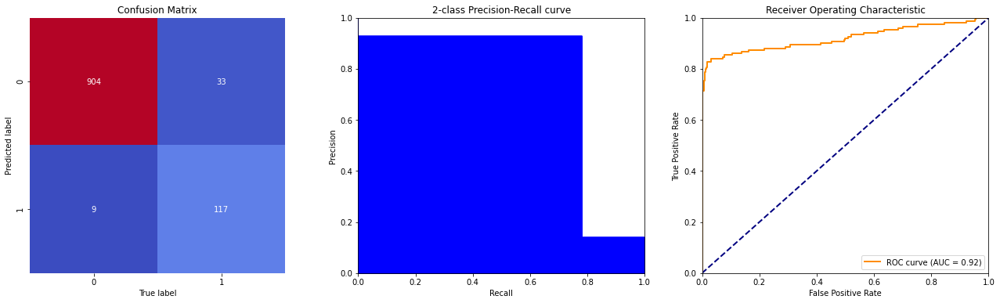


---------------------------
- XGBClassifier_Opt_SMOTE -
---------------------------
Accuracy : 0.9539 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.8686 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.7933 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.9211                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


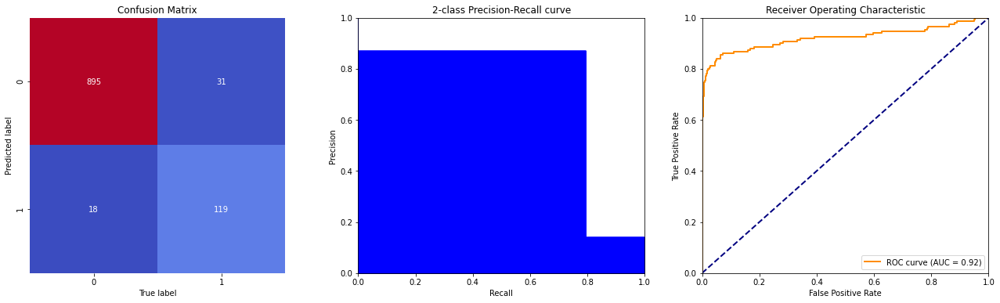


-----------------------
- XGBoost_TunnedThres -
-----------------------
Accuracy : 0.9539 [TP / N] Proportion of predicted labels that match the true labels. Best: 1, Worst: 0
Precision: 0.8686 [TP / (TP + FP)] Not to label a negative sample as positive.        Best: 1, Worst: 0
Recall   : 0.7933 [TP / (TP + FN)] Find all the positive samples.                     Best: 1, Worst: 0
ROC AUC  : 0.9211                                                                     Best: 1, Worst: < 0.5
-----------------------------------------------------------------------------------------------------------
TP: True Positives, FP: False Positives, TN: True Negatives, FN: False Negatives, N: Number of samples


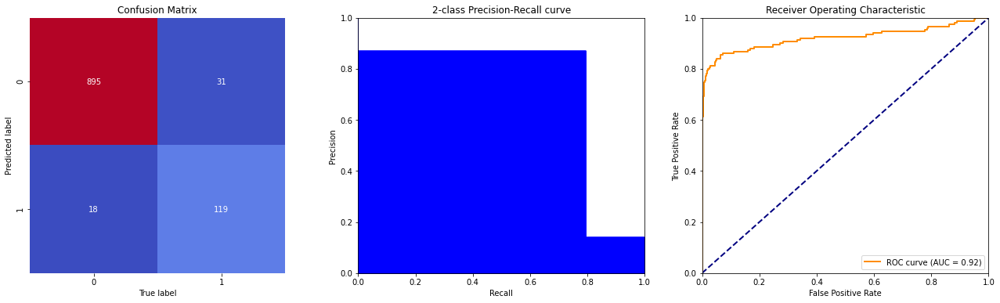

In [141]:
# Keep the results in a dataframe
results = pd.DataFrame(columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'ROC_AUC'])

models = ['XGBClassifier_Opt','XGBClassifier_Opt_SMOTE','XGBoost_TunnedThres' ]         

for i, m in enumerate([gbm_optuna,gbm_optuna_SMOTE,gbm_optuna_SMOTE_Thers]):
    print('-' * (len(models[i]) + 4))
    print('- %s -' % models[i])
    print('-'*(len(models[i]) + 4))
    predictions = m.predict(X_test)
    probabilities = m.predict_proba(X_test)
    # show the report
    accuracy_, precision_, recall_, roc_auc_ = show_summary_report(y_test, predictions, probabilities)
    # keep the results
    results.loc[i] = {'Model': models[i], 
                      'Accuracy': accuracy_, 
                      'Precision': precision_,
                      'Recall': recall_,
                      'ROC_AUC': roc_auc_}
  
    print()    

In [142]:
results


,Model,Accuracy,Precision,Recall,ROC_AUC
0,XGBClassifier_Opt,0.960489,0.928571,0.780000,0.919022
1,XGBClassifier_Opt_SMOTE,0.953904,0.868613,0.793333,0.921081
2,XGBoost_TunnedThres,0.953904,0.868613,0.793333,0.921081


In [143]:
import plotly.graph_objects as go

x = results['Model']
y = results['Accuracy']

# Use the hovertext kw argument for hover text
fig = go.Figure(data=[go.Bar(x=x, y=y)])
# Customize aspect
fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)
fig.update_layout(title_text='Model Accuracy Scores')
fig.show()

In [144]:
import plotly.graph_objects as go

x = results['Model']
y = results['Recall']

# Use the hovertext kw argument for hover text
fig = go.Figure(data=[go.Bar(x=x, y=y)])
# Customize aspect
fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)
fig.update_layout(title_text='Models Recall Scores')
fig.show()

In [145]:

import plotly.graph_objects as go

x = results['Model']
y = results['ROC_AUC']

# Use the hovertext kw argument for hover text
fig = go.Figure(data=[go.Bar(x=x, y=y)])
# Customize aspect
fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)
fig.update_layout(title_text='Models ROC_AUC Scores')
fig.show()

### Conclusion: The selected model is XGBClassifier_opt_SMOTE because of its best performancs with accuarcy of 95.39% ,Reacll score of 79% and Roc-AUC score 92% and lastly without showing any  warning signs this model would be taken for the deployment.